In [1]:

import numpy as np
import pandas as pd
from pathlib import Path
from pynwb import NWBHDF5IO
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Dict, List, Tuple, Set
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')


In [2]:

# ============================================================================
# CONFIGURATION
# ============================================================================

# File paths - UPDATE THESE
BASE_PATH = Path('/oak/stanford/groups/ckeller1/data/iEEG_EHR/iEEG_NWB')
REGISTRY_PATH = Path('/oak/stanford/groups/ckeller1/data/iEEG_EHR/iEEG_NWB/sherlock_file_registry.csv')  # UPDATE THIS
PLOT_DIR = Path('plots/pain_score_regional_analysis')

# Create plot directory
PLOT_DIR.mkdir(parents=True, exist_ok=True)

# Validated subjects - FILL THIS IN, or leave empty to process all subjects
VALIDATED_SUBJECTS = [
    # '256',
    # '123',
    # '045',
]
# If empty, will automatically find all subjects from the file metadata

# Band definitions
BAND_NAMES = ['delta', 'theta', 'alpha', 'beta', 'gamma', 'high_gamma']
BAND_BANDWIDTHS = {
    'delta': 3,        # 1-4 Hz
    'theta': 4,        # 4-8 Hz
    'alpha': 4,        # 8-12 Hz
    'beta': 10,        # 15-25 Hz
    'gamma': 45,       # 25-70 Hz
    'high_gamma': 100  # 70-170 Hz
}
TOTAL_BANDWIDTH = sum(BAND_BANDWIDTHS.values())

# Analysis parameters
WINDOW_MINUTES = 5  # 5 minutes before pain score
SESSION_START_EXCLUSION_MINUTES = 20  # Exclude first 20 minutes
OUTLIER_THRESHOLD_SD = 5  # Outlier detection threshold
MIN_PAIN_RANGE = 4  # Minimum pain score range to include subject


In [19]:
"""
===============================================================================
CELL 1: CONFIGURATION AND HELPER FUNCTIONS
===============================================================================
"""


# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def load_file_metadata(metadata_csv_path: Path) -> pd.DataFrame:
    """Load file metadata with timing information."""
    metadata = pd.read_csv(metadata_csv_path)
    metadata['start_datetime'] = pd.to_datetime(metadata['start_datetime'])
    metadata['end_datetime'] = pd.to_datetime(metadata['end_datetime'])
    metadata = metadata[metadata['has_preprocessed'] == True].copy()
    return metadata


def load_pain_scores(subject_id: str, session_id: str) -> pd.DataFrame:
    """Load pain score event times."""
    ehr_dir = BASE_PATH / f'sub-{subject_id}' / f'ses-{session_id}' / 'ehr'
    pain_file = ehr_dir / f'sub-{subject_id}_ses-{session_id}_pain-scores.csv'
    
    if not pain_file.exists():
        print(f"Warning: Pain scores file not found: {pain_file}")
        return pd.DataFrame()
    
    pain_df = pd.read_csv(pain_file)
    pain_df['date'] = pd.to_datetime(pain_df['date'])
    
    # Filter for this specific subject and session
    pain_df = pain_df[
        (pain_df['sub_id'] == f'sub-{subject_id}') & 
        (pain_df['ses_id'] == f'ses-{session_id}')
    ]
    
    # Remove NaN pain scores
    pain_df = pain_df[~pain_df['max_pain'].isna()]
    
    return pain_df


def get_relevant_files(file_metadata: pd.DataFrame,
                      subject_id: str,
                      session_id: str,
                      event_df: pd.DataFrame,
                      window_minutes: int = 5) -> List[Path]:
    """Get only the NWB files that overlap with event windows."""
    session_files = file_metadata[
        (file_metadata['sub_id'] == f'sub-{subject_id}') & 
        (file_metadata['ses_id'] == f'ses-{session_id}')
    ].copy()
    
    if len(session_files) == 0:
        return []
    
    relevant_files = []
    
    for event_idx, event_row in event_df.iterrows():
        event_time = event_row['date']
        window_start = event_time - pd.Timedelta(minutes=window_minutes)
        window_end = event_time
        
        overlapping = session_files[
            (session_files['start_datetime'] <= window_end) &
            (session_files['end_datetime'] >= window_start)
        ]
        
        for _, file_row in overlapping.iterrows():
            file_path = Path(file_row['preprocessed_file_path'])
            if file_path not in relevant_files:
                relevant_files.append(file_path)
    
    return sorted(relevant_files)


def load_electrode_labels(nwb_file: Path) -> Dict[int, str]:
    """Load electrode labels from Desikan-Killiany atlas."""
    electrode_labels = {}
    
    try:
        with NWBHDF5IO(str(nwb_file), 'r') as io:
            nwb = io.read()
            electrodes_df = nwb.electrodes.to_dataframe()
            
            if 'Desikan_Killiany_cathode' in electrodes_df.columns:
                for idx, row in electrodes_df.iterrows():
                    label = row['Desikan_Killiany_cathode']
                    if pd.isna(label) or label == '' or label == 'nan':
                        electrode_labels[idx] = 'unknown'
                    else:
                        electrode_labels[idx] = str(label).lower()
                        
    except Exception as e:
        print(f"Error loading electrode labels from {nwb_file}: {e}")
    
    return electrode_labels


def filter_valid_channels(electrode_labels: Dict[int, str]) -> Set[int]:
    """Filter out unknown and white-matter channels."""
    valid_indices = set()
    
    for ch_idx, label in electrode_labels.items():
        label_lower = label.lower()
        if 'unknown' not in label_lower and \
           'white-matter' not in label_lower and \
           'white matter' not in label_lower:
            valid_indices.add(ch_idx)
    
    return valid_indices


def extract_data_around_events_log(nwb_file: Path, 
                                   event_df: pd.DataFrame,
                                   valid_channel_indices: Set[int],
                                   session_start_time: pd.Timestamp,
                                   window_minutes: int = 5) -> Dict:
    """Extract bandpower data in LOG SPACE within event windows."""
    event_data = {}
    
    with NWBHDF5IO(str(nwb_file), 'r') as io:
        nwb = io.read()
        session_start = nwb.session_start_time
        
        band_power_series = nwb.processing['ecephys']["band_power"]
        band_power_data = band_power_series.data[:]
        
        # Get timestamps
        if band_power_series.timestamps is not None:
            band_power_timestamps = band_power_series.timestamps[:]
        else:
            starting_time = band_power_series.starting_time
            rate = band_power_series.rate
            n_timepoints = band_power_data.shape[0]
            band_power_timestamps = starting_time + np.arange(n_timepoints) / rate
        
        # Convert to datetime
        band_power_datetimes = pd.to_datetime(session_start) + pd.to_timedelta(band_power_timestamps, unit='s')
        band_power_datetimes = band_power_datetimes.tz_localize(None)
        
        # Process each event
        for event_idx, row in event_df.iterrows():
            event_time = row['date']
            window_start = event_time - pd.Timedelta(minutes=window_minutes)
            window_end = event_time
            
            mask = (band_power_datetimes >= window_start) & (band_power_datetimes <= window_end)
            
            if not np.any(mask):
                continue
            
            window_data = band_power_data[mask, :, :]
            valid_channel_list = sorted(list(valid_channel_indices))
            window_data_filtered = window_data[:, valid_channel_list, :]
            
            # LOG TRANSFORM IMMEDIATELY
            window_data_filtered_log = np.log10(np.maximum(window_data_filtered, 1e-20))

            
            if event_idx not in event_data:
                event_data[event_idx] = {
                    'bandpower_log': [],
                    'pain_score': row['max_pain'],
                    'event_time': event_time
                }
            
            event_data[event_idx]['bandpower_log'].append(window_data_filtered_log)
    
    return event_data


def compute_weighted_broadband(bandpower_log: np.ndarray) -> np.ndarray:
    """
    Compute weighted broadband power in log space.
    
    Args:
        bandpower_log: Shape (timepoints, channels, bands) in LOG SPACE
    
    Returns:
        weighted_broadband: Shape (channels,) - average weighted broadband per channel
    """
    # Average across time for each channel and band
    band_power_avg_log = np.mean(bandpower_log, axis=0)  # Shape: (channels, bands)
    
    # Weight by bandwidth and sum across bands
    weighted_broadband = np.zeros(band_power_avg_log.shape[0])
    
    for band_idx, band_name in enumerate(BAND_NAMES):
        bandwidth = BAND_BANDWIDTHS[band_name]
        weighted_broadband += band_power_avg_log[:, band_idx] * bandwidth
    
    # Normalize by total bandwidth
    weighted_broadband /= TOTAL_BANDWIDTH
    
    return weighted_broadband


def compute_outlier_masks(all_epoch_data: Dict, 
                         valid_channel_indices: Set[int]) -> Tuple[Dict, Dict]:
    """
    Compute outlier masks across ALL epochs (before separating by pain level).
    
    Args:
        all_epoch_data: Dictionary of all pain epochs (both low and high)
        valid_channel_indices: Set of valid channel indices
    
    Returns:
        channel_outlier_mask: Dict mapping ch_idx -> boolean array (True = outlier for that epoch)
        epoch_bandpower_logs: Dict mapping event_idx -> bandpower_log array
    """
    valid_channel_list = sorted(list(valid_channel_indices))
    n_channels = len(valid_channel_list)
    
    # Collect all channel broadband values across ALL epochs
    all_channel_broadband = {ch_idx: [] for ch_idx in range(n_channels)}
    epoch_bandpower_logs = {}
    event_indices_ordered = []
    
    # First pass: collect all data
    for event_idx, event_info in all_epoch_data.items():
        # Concatenate bandpower arrays if multiple files
        if len(event_info['bandpower_log']) > 1:
            bandpower_log = np.concatenate(event_info['bandpower_log'], axis=0)
        else:
            bandpower_log = event_info['bandpower_log'][0]
        
        epoch_bandpower_logs[event_idx] = bandpower_log
        event_indices_ordered.append(event_idx)
        
        # Compute weighted broadband for this epoch
        channel_broadband = compute_weighted_broadband(bandpower_log)
        
        for ch_idx_in_valid in range(n_channels):
            all_channel_broadband[ch_idx_in_valid].append(channel_broadband[ch_idx_in_valid])
    
    # Compute outlier thresholds per channel across ALL epochs
    channel_outlier_mask = {}
    n_outliers_total = 0
    
    for ch_idx_in_valid in range(n_channels):
        if len(all_channel_broadband[ch_idx_in_valid]) > 0:
            values = np.array(all_channel_broadband[ch_idx_in_valid])
            mean_val = np.mean(values)
            std_val = np.std(values)
            
            # Mark epochs as outliers for this channel
            outlier_mask = np.abs(values - mean_val) > (OUTLIER_THRESHOLD_SD * std_val)
            channel_outlier_mask[ch_idx_in_valid] = outlier_mask
            n_outliers_total += np.sum(outlier_mask)
        else:
            channel_outlier_mask[ch_idx_in_valid] = np.array([])
    
    n_total_measurements = n_channels * len(event_indices_ordered)
    if n_total_measurements == 0:
        print("    Warning: No valid epoch data found for outlier computation")
        return {}, {}

    print(f"    Outliers detected: {n_outliers_total}/{n_total_measurements} " +
        f"({100*n_outliers_total/n_total_measurements:.2f}%)")
    return channel_outlier_mask, epoch_bandpower_logs


def aggregate_regional_data(all_epoch_data: Dict,
                           target_event_indices: Set[int],
                           epoch_bandpower_logs: Dict,
                           channel_outlier_mask: Dict,
                           electrode_labels: Dict[int, str],
                           valid_channel_indices: Set[int]) -> Dict:
    """
    Aggregate data by region for specified epochs, excluding outliers.
    
    Args:
        all_epoch_data: All epoch data
        target_event_indices: Set of event indices to include (low or high pain)
        epoch_bandpower_logs: Precomputed bandpower logs
        channel_outlier_mask: Precomputed outlier masks
        electrode_labels: Channel to region mapping
        valid_channel_indices: Valid channel indices
    
    Returns:
        regional_averages: {region: {band: average_value}}
    """
    valid_channel_list = sorted(list(valid_channel_indices))
    n_bands = len(BAND_NAMES)
    
    # Map event_idx to position in ordered list
    event_idx_to_position = {}
    for pos, event_idx in enumerate(all_epoch_data.keys()):
        event_idx_to_position[event_idx] = pos
    
    # Aggregate data
    regional_data = defaultdict(lambda: defaultdict(list))
    
    for event_idx in target_event_indices:
        if event_idx not in epoch_bandpower_logs:
            continue
        
        bandpower_log = epoch_bandpower_logs[event_idx]
        epoch_position = event_idx_to_position[event_idx]
        
        # Average across time for each channel and band
        band_power_avg_log = np.mean(bandpower_log, axis=0)  # Shape: (channels, bands)
        
        # Group by brain region
        for ch_idx_in_valid, ch_idx_global in enumerate(valid_channel_list):
            # Check if this channel is an outlier for this epoch
            if ch_idx_in_valid in channel_outlier_mask:
                if epoch_position < len(channel_outlier_mask[ch_idx_in_valid]):
                    if channel_outlier_mask[ch_idx_in_valid][epoch_position]:
                        continue  # Skip this channel for this epoch
            
            region = electrode_labels.get(ch_idx_global, 'unknown')
            
            if 'unknown' in region.lower() or 'white' in region.lower():
                continue
            
            # Add this channel's band powers to the region
            for band_idx in range(n_bands):
                regional_data[region][band_idx].append(band_power_avg_log[ch_idx_in_valid, band_idx])
    
    # Average across channels within each region for each band
    regional_averages = {}
    for region, band_dict in regional_data.items():
        regional_averages[region] = {}
        for band_idx, values in band_dict.items():
            if len(values) > 0:
                regional_averages[region][band_idx] = np.mean(values)
    
    return regional_averages


print("✓ Configuration and helper functions loaded!")
print(f"  Plot directory: {PLOT_DIR}")
if len(VALIDATED_SUBJECTS) == 0:
    print(f"  Validated subjects: Auto-discover mode (will find all subjects)")
else:
    print(f"  Validated subjects: {len(VALIDATED_SUBJECTS)}")
print(f"  Window: {WINDOW_MINUTES} minutes before pain score")
print(f"  Outlier threshold: {OUTLIER_THRESHOLD_SD} SD")
print(f"  Min pain range: {MIN_PAIN_RANGE}")


"""
===============================================================================
CELL 2: DATA LOADING AND PROCESSING
===============================================================================
"""

def process_subject_session(subject_id: str, 
                           session_id: str, 
                           file_metadata: pd.DataFrame) -> Dict:
    """Process all pain score epochs for a subject-session."""
    print(f"\n{'='*80}")
    print(f"Processing sub-{subject_id}, ses-{session_id}")
    print(f"{'='*80}")
    
    # Load pain scores
    pain_df = load_pain_scores(subject_id, session_id)
    
    if len(pain_df) == 0:
        print("  ✗ No pain scores found")
        return None
    
    # Get session start time from first NWB file
    session_files = file_metadata[
        (file_metadata['sub_id'] == f'sub-{subject_id}') & 
        (file_metadata['ses_id'] == f'ses-{session_id}')
    ]
    
    if len(session_files) == 0:
        print("  ✗ No NWB files found in metadata")
        return None
    
    first_nwb_file = Path(session_files.iloc[0]['preprocessed_file_path'])
    
    # Get session start time
    try:
        with NWBHDF5IO(str(first_nwb_file), 'r') as io:
            nwb = io.read()
            session_start_time = pd.to_datetime(nwb.session_start_time).tz_localize(None)
    except Exception as e:
        print(f"  ✗ Error reading session start time: {e}")
        return None
    
    # Exclude pain scores in first 20 minutes of session
    pain_df = pain_df[
        pain_df['date'] >= (session_start_time + pd.Timedelta(minutes=SESSION_START_EXCLUSION_MINUTES))
    ].copy()
    
    if len(pain_df) == 0:
        print(f"  ✗ No pain scores after excluding first {SESSION_START_EXCLUSION_MINUTES} minutes")
        return None
    
    # Check pain score range
    pain_range = pain_df['max_pain'].max() - pain_df['max_pain'].min()
    if pain_range < MIN_PAIN_RANGE:
        print(f"  ✗ Pain score range ({pain_range:.1f}) < {MIN_PAIN_RANGE}")
        return None
    
    # Calculate quartiles
    q25 = pain_df['max_pain'].quantile(0.25)
    q75 = pain_df['max_pain'].quantile(0.75)
    
    if q25 == q75:
        print(f"  ✗ Low and high pain thresholds equal ({q25:.1f})")
        return None
    
    print(f"  ✓ Pain scores: {len(pain_df)}")
    print(f"    Range: {pain_df['max_pain'].min():.1f} - {pain_df['max_pain'].max():.1f}")
    print(f"    Low pain (≤25%): ≤{q25:.1f}")
    print(f"    High pain (≥75%): ≥{q75:.1f}")
    
    # Separate into low and high pain
    low_pain_df = pain_df[pain_df['max_pain'] <= q25].copy()
    high_pain_df = pain_df[pain_df['max_pain'] >= q75].copy()
    
    print(f"    Low pain epochs: {len(low_pain_df)}")
    print(f"    High pain epochs: {len(high_pain_df)}")
    
    # Get relevant files for ALL pain epochs
    all_pain_df = pd.concat([low_pain_df, high_pain_df])
    relevant_files = get_relevant_files(file_metadata, subject_id, session_id, 
                                       all_pain_df, window_minutes=WINDOW_MINUTES)
    
    if len(relevant_files) == 0:
        print("  ✗ No relevant NWB files found")
        return None
    
    print(f"  ✓ Loading {len(relevant_files)} NWB files...")
    
    # Load electrode labels from first file
    electrode_labels = load_electrode_labels(relevant_files[0])
    valid_channel_indices = filter_valid_channels(electrode_labels)
    
    print(f"  ✓ Valid channels: {len(valid_channel_indices)}/{len(electrode_labels)}")
    
    # Process ALL pain epochs together (both low and high)
    print(f"  → Processing all {len(all_pain_df)} pain epochs...")
    all_pain_data = {}
    for nwb_file in relevant_files:
        file_data = extract_data_around_events_log(
            nwb_file, all_pain_df, valid_channel_indices, 
            session_start_time, window_minutes=WINDOW_MINUTES
        )
        all_pain_data.update(file_data)
    
    print(f"  ✓ Extracted: {len(all_pain_data)} epochs")
    
    # Compute outlier masks across ALL epochs (before separating by pain level)
    print(f"  → Computing outlier masks across all epochs...")
    channel_outlier_mask, epoch_bandpower_logs = compute_outlier_masks(
        all_pain_data, valid_channel_indices
    )
    
    # Now separate into low and high pain and aggregate with outlier exclusions
    print(f"  → Aggregating by pain level with outlier exclusions...")
    
    result = {
        'subject_id': subject_id,
        'session_id': session_id,
        'low_pain': {},
        'high_pain': {},
        'electrode_labels': electrode_labels,
        'valid_channel_indices': valid_channel_indices
    }
    
    # Get event indices for low and high pain
    low_pain_event_indices = set(low_pain_df.index)
    high_pain_event_indices = set(high_pain_df.index)
    
    result['low_pain'] = aggregate_regional_data(
        all_pain_data, low_pain_event_indices, epoch_bandpower_logs,
        channel_outlier_mask, electrode_labels, valid_channel_indices
    )
    
    result['high_pain'] = aggregate_regional_data(
        all_pain_data, high_pain_event_indices, epoch_bandpower_logs,
        channel_outlier_mask, electrode_labels, valid_channel_indices
    )
    
    n_regions_low = len(result['low_pain'])
    n_regions_high = len(result['high_pain'])
    print(f"  ✓ Regional data: {n_regions_low} regions (low), {n_regions_high} regions (high)")
    
    return result


# Main data loading
print("\n" + "="*80)
print("STARTING DATA LOADING")
print("="*80)

print("\nLoading file metadata...")
file_metadata = load_file_metadata(REGISTRY_PATH)
print(f"✓ Loaded metadata for {len(file_metadata)} files")

# Automatically find subjects if VALIDATED_SUBJECTS is empty
if len(VALIDATED_SUBJECTS) == 0:
    print("\nNo validated subjects specified - finding all subjects...")
    
    # Extract unique subject IDs from metadata
    unique_subjects = file_metadata['sub_id'].unique()
    
    # Remove 'sub-' prefix to get just the ID
    subject_ids = [sub_id.replace('sub-', '') for sub_id in unique_subjects if sub_id.startswith('sub-')]
    subject_ids = sorted(subject_ids)
    
    print(f"✓ Found {len(subject_ids)} subjects in metadata:")
    print(f"  {', '.join(subject_ids)}")
    
    subjects_to_process = subject_ids
else:
    print(f"\n✓ Processing {len(VALIDATED_SUBJECTS)} validated subjects")
    subjects_to_process = VALIDATED_SUBJECTS

# Process all subjects
all_results = []
failed_subjects = []

for subject_id in subjects_to_process:
    session_id = '01'
    try:
        result = process_subject_session(subject_id, session_id, file_metadata)
        if result is not None:
            all_results.append(result)
    except Exception as e:
        print(f"\n  ✗ Subject {subject_id} failed: {type(e).__name__}: {e}")
        failed_subjects.append((subject_id, str(e)))
        continue

print(f"\n{'='*80}")
print(f"DATA LOADING COMPLETE")
print(f"{'='*80}")
print(f"Successfully processed: {len(all_results)}/{len(subjects_to_process)} subjects")
if failed_subjects:
    print(f"Failed subjects ({len(failed_subjects)}):")
    for subj, err in failed_subjects:
        print(f"  sub-{subj}: {err}")
print(f"{'='*80}\n")

✓ Configuration and helper functions loaded!
  Plot directory: plots/pain_score_regional_analysis
  Validated subjects: Auto-discover mode (will find all subjects)
  Window: 5 minutes before pain score
  Outlier threshold: 5 SD
  Min pain range: 4

STARTING DATA LOADING

Loading file metadata...
✓ Loaded metadata for 5766 files

No validated subjects specified - finding all subjects...
✓ Found 86 subjects in metadata:
  019, 051, 058, 067, 084, 085, 088, 090, 093, 099, 100, 107, 109, 110, 111, 120, 122, 124, 126, 127, 131, 138, 143, 150, 152, 154, 159, 167, 169, 172, 175, 176, 177, 178, 182, 183, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 201, 202, 203, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 217, 218, 222, 227, 229, 230, 231, 233, 234, 235, 236, 237, 239, 240, 242, 244, 245, 247, 248, 250, 251, 252, 255, 256, 257, 259

Processing sub-019, ses-01
  ✓ Pain scores: 50
    Range: 0.0 - 7.0
    Low pain (≤25%): ≤0.0
    High pain (≥75%): ≥4.0
    Low pain epochs: 23
 

In [5]:
"""
===============================================================================
CELL 2.5: SAVE / LOAD RESULTS
===============================================================================
"""

import json
from pathlib import Path

RESULTS_SAVE_PATH = Path('results/pain_score_regional_analysis')
RESULTS_SAVE_PATH.mkdir(parents=True, exist_ok=True)


def save_results(all_results, path: Path = RESULTS_SAVE_PATH):
    """Serialize all_results to JSON."""
    
    def convert(obj):
        """Recursively convert numpy/pandas types to JSON-serializable types."""
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        elif isinstance(obj, pd.Timestamp):
            return obj.isoformat()
        elif isinstance(obj, set):
            return list(obj)
        return obj

    serializable = []
    for result in all_results:
        r = {
            'subject_id':           result['subject_id'],
            'session_id':           result['session_id'],
            'low_pain':             {},
            'high_pain':            {},
            # Convert set -> list, int keys -> str for JSON
            'valid_channel_indices': list(result['valid_channel_indices']),
            # electrode_labels has int keys which JSON requires to be strings
            'electrode_labels':     {str(k): v for k, v in result['electrode_labels'].items()},
        }

        for pain_level in ('low_pain', 'high_pain'):
            for region, band_dict in result[pain_level].items():
                # band_dict keys are int (band index) - convert to str for JSON
                r[pain_level][region] = {str(k): convert(v) for k, v in band_dict.items()}

        serializable.append(r)

    out_file = path / 'all_results.json'
    with open(out_file, 'w') as f:
        json.dump(serializable, f, indent=2, default=convert)

    print(f"✓ Saved {len(all_results)} subjects to {out_file}")
    print(f"  File size: {out_file.stat().st_size / 1024 / 1024:.2f} MB")


def load_results(path: Path = RESULTS_SAVE_PATH) -> list:
    """Load results from JSON and restore types."""
    in_file = path / 'all_results.json'

    if not in_file.exists():
        raise FileNotFoundError(f"No saved results found at {in_file}")

    with open(in_file, 'r') as f:
        raw = json.load(f)

    all_results = []
    for r in raw:
        result = {
            'subject_id':           r['subject_id'],
            'session_id':           r['session_id'],
            'valid_channel_indices': set(r['valid_channel_indices']),
            # Restore int keys for electrode_labels
            'electrode_labels':     {int(k): v for k, v in r['electrode_labels'].items()},
            'low_pain':             {},
            'high_pain':            {},
        }

        for pain_level in ('low_pain', 'high_pain'):
            for region, band_dict in r[pain_level].items():
                # Restore int keys for band indices
                result[pain_level][region] = {int(k): v for k, v in band_dict.items()}

        all_results.append(result)

    print(f"✓ Loaded {len(all_results)} subjects from {in_file}")
    return all_results


# ── Usage ──────────────────────────────────────────────────────────────────

# # After data loading, save:
#save_results(all_results)

# To reload later instead of rerunning data loading (run this cell alone):
all_results = load_results()

✓ Loaded 66 subjects from results/pain_score_regional_analysis/all_results.json


In [6]:
from typing import List, Dict, Set

"""
===============================================================================
CELL 3: ORGANIZE DATA FOR PLOTTING
===============================================================================
"""

# ============================================================================
# REGION GROUPING MAP
# Maps Desikan-Killiany label substrings -> canonical grouped region name.
# Matching is done on lowercase label; first match wins.
# ============================================================================

REGION_GROUP_MAP = {
    # Frontal
    'frontal':          'Frontal',
    'precentral':       'Frontal',
    'paracentral':      'Frontal',
    'parsopercularis':  'Frontal',
    'parsorbitalis':    'Frontal',
    'parstriangularis': 'Frontal',
    'caudalmiddlefrontal': 'Frontal',
    'rostralmiddlefrontal': 'Frontal',
    'superiorfrontal':  'Frontal',
    'medialorbitofrontal': 'OFC',       # keep OFC separate (see below)
    'lateralorbitofrontal': 'OFC',

    # OFC (explicit Desikan labels — matched before generic 'frontal' substring)
    'orbitofrontal':    'OFC',

    # Temporal
    'temporal':         'Temporal',
    'entorhinal':       'Temporal',
    'parahippocampal':  'Temporal',
    'fusiform':         'Temporal',
    'transversetemporal': 'Temporal',

    # Parietal
    'parietal':         'Parietal',
    'postcentral':      'Parietal',
    'supramarginal':    'Parietal',
    'precuneus':        'Parietal',

    # Insula
    'insula':           'Insula',

    # Cingulate — split ACC vs PCC
    'rostralanteriorcingulate':  'ACC',
    'caudalanteriorcingulate':   'ACC',
    'posteriorcingulate':        'PCC',
    'isthmuscingulate':          'PCC',

    # Subcortical
    'thalamus':         'Thalamus',
    'hippocampus':      'Hippocampus',
    'amygdala':         'Amygdala',
    'putamen':          'Putamen',
    'pallidum':         'Pallidum',
    'caudate':          'Caudate',

    # Add Accumbens as its own group
    'accumbens-area':   'Accumbens',



    # Add Occipital group (or just exclude — your call)
    'cuneus':           'Occipital',
    'lingual':          'Occipital',
    'lateraloccipital': 'Occipital',
    'pericalcarine':    'Occipital',
    }

# Desired display order for subplots
REGION_ORDER = [
    'Frontal', 'Temporal', 'Parietal', 'Insula',
    'Thalamus', 'Hippocampus', 'PCC', 'Amygdala',
    'ACC', 'Putamen', 'Pallidum', 'Caudate', 'OFC', 'Accumbens'
]



from typing import Dict, List, Set
from collections import defaultdict
import numpy as np

BAND_NAMES = ['delta', 'theta', 'alpha', 'beta', 'gamma', 'high_gamma']

# ============================================================================
# REGION GROUPING MAP
# ============================================================================

REGION_GROUP_MAP = {
    # ── Motor Cortex ──────────────────────────────────────────────────────
    'precentral':           'Motor Cortex',
    'paracentral':          'Motor Cortex',

    # ── Lateral PFC ───────────────────────────────────────────────────────
    # Listed BEFORE any generic 'frontal' substring to avoid false matches
    'superiorfrontal':      'Lateral PFC',
    'rostralmiddlefrontal': 'Lateral PFC',
    'caudalmiddlefrontal':  'Lateral PFC',
    'parsopercularis':      'Lateral PFC',
    'parstriangularis':     'Lateral PFC',
    'parsorbitalis':        'Lateral PFC',

    # ── OFC ───────────────────────────────────────────────────────────────
    'medialorbitofrontal':  'OFC',
    'lateralorbitofrontal': 'OFC',

    # ── ACC ───────────────────────────────────────────────────────────────
    'rostralanteriorcingulate': 'ACC',
    'caudalanteriorcingulate':  'ACC',

    # ── PCC ───────────────────────────────────────────────────────────────
    'posteriorcingulate':   'PCC',
    'isthmuscingulate':     'PCC',

    # ── Lateral Temporal ──────────────────────────────────────────────────
    'superiortemporal':     'Lateral Temporal',
    'middletemporal':       'Lateral Temporal',
    'inferiortemporal':     'Lateral Temporal',
    'transversetemporal':   'Lateral Temporal',
    'bankssts':             'Lateral Temporal',

    # ── Ventral Temporal ──────────────────────────────────────────────────
    'fusiform':             'Ventral Temporal',
    'parahippocampal':      'Ventral Temporal',

    # ── Parietal ──────────────────────────────────────────────────────────
    'inferiorparietal':     'Parietal',
    'superiorparietal':     'Parietal',
    'supramarginal':        'Parietal',
    'postcentral':          'Parietal',
    'precuneus':            'Parietal',

    # ── Insula ────────────────────────────────────────────────────────────
    'insula':               'Insula',

    # ── Occipital ─────────────────────────────────────────────────────────
    'cuneus':               'Occipital',
    'lingual':              'Occipital',
    'lateraloccipital':     'Occipital',
    'pericalcarine':        'Occipital',

    # ── Hippocampus ───────────────────────────────────────────────────────
    'hippocampus':          'Hippocampus',

    # ── Amygdala ──────────────────────────────────────────────────────────
    'amygdala':             'Amygdala',

    # ── Striatum (Putamen + Caudate + Accumbens) ──────────────────────────
    'putamen':              'Striatum',
    'caudate':              'Striatum',
    'accumbens-area':       'Striatum',

    # ── Pallidum ──────────────────────────────────────────────────────────
    'pallidum':             'Pallidum',

    # ── Thalamus / Diencephalon ───────────────────────────────────────────
    'thalamus-proper':      'Thalamus',
}

# Explicitly excluded — checked before prefix stripping
EXCLUDE_LABELS = {
    'frontalpole',          # n=1
    'entorhinal',           # n=2
    'temporalpole',         # n=7
    '3rd-ventricle',
    'left-lateral-ventricle',
    'right-lateral-ventricle',
    'left-inf-lat-vent',
    'right-inf-lat-vent',
    'left-choroid-plexus',
    'right-choroid-plexus',
    'wm-hypointensities',
    'undefined',
    'left-ventraldc',       # caught by ventraldc key after prefix strip
    'right-ventraldc',      # but listed here as safety net
}

REGION_ORDER = [
    # Cortical — frontal
    'Motor Cortex', 'Lateral PFC', 'OFC', 'ACC', 'PCC',
    # Cortical — posterior
    'Lateral Temporal', 'Ventral Temporal', 'Parietal', 'Insula', 'Occipital',
    # Limbic
    'Hippocampus', 'Amygdala',
    # Subcortical
    'Striatum', 'Pallidum', 'Thalamus',
]


def map_to_group(dk_label: str) -> str | None:
    """
    Map a Desikan-Killiany electrode label to a canonical grouped region.
    Returns None if the label doesn't belong to any target group.

    Matching strategy:
      1. Strip hemisphere prefix  (ctx-lh-*, ctx-rh-*, Left-*, Right-*, wm-lh-*, etc.)
      2. Lowercase the remainder
      3. Walk REGION_GROUP_MAP in insertion order; return on first substring match
    """
    label = dk_label.lower().strip()

    # Strip common hemisphere/tissue prefixes
    for prefix in ('ctx-lh-', 'ctx-rh-', 'wm-lh-', 'wm-rh-',
                   'left-', 'right-', 'left_', 'right_'):
        if label.startswith(prefix):
            label = label[len(prefix):]
            break

    for key, group in REGION_GROUP_MAP.items():
        if key in label:
            return group

    return None  # Not in any target group


def organize_data_for_plotting(all_results: List[Dict]) -> Dict:
    """
    Organize data into format for plotting, collapsing electrodes into
    grouped anatomical regions and discarding non-target regions.

    Returns: {
        band_idx: {
            region: {
                'low_pain':     [one value per subject-session],
                'high_pain':    [one value per subject-session],
                'subjects_low': [subject_ids],
                'subjects_high':[subject_ids],
            }
        }
    }
    """
    plot_data = {
        band_idx: defaultdict(lambda: {
            'low_pain': [], 'high_pain': [],
            'subjects_low': [], 'subjects_high': []
        })
        for band_idx in range(len(BAND_NAMES))
    }

    skipped_regions = set()

    for result in all_results:
        subject_id = result['subject_id']

        for pain_level in ('low_pain', 'high_pain'):
            subjects_key = 'subjects_low' if pain_level == 'low_pain' else 'subjects_high'

            # Accumulate per grouped-region across DK labels for THIS subject-session
            # so each subject contributes exactly one averaged value per group per band.
            # Structure: group -> band_idx -> [dk-region values]
            group_band_values: Dict[str, Dict[int, List[float]]] = defaultdict(lambda: defaultdict(list))

            for dk_region, band_dict in result[pain_level].items():
                group = map_to_group(dk_region)
                if group is None:
                    skipped_regions.add(dk_region)
                    continue
                for band_idx, value in band_dict.items():
                    group_band_values[group][band_idx].append(value)

            # Average across DK sub-regions within each group, then append
            for group, band_dict in group_band_values.items():
                for band_idx, values in band_dict.items():
                    plot_data[band_idx][group][pain_level].append(np.mean(values))
                    plot_data[band_idx][group][subjects_key].append(subject_id)

    if skipped_regions:
        print(f"  Skipped {len(skipped_regions)} non-target DK regions "
              f"(e.g. {', '.join(sorted(skipped_regions)[:5])}{'...' if len(skipped_regions) > 5 else ''})")

    return plot_data


print("Organizing data for plotting...")
plot_data = organize_data_for_plotting(all_results)

print("\n" + "="*80)
print("DATA ORGANIZATION COMPLETE")
print("="*80)

for band_idx, band_name in enumerate(BAND_NAMES):
    regions = list(plot_data[band_idx].keys())
    print(f"  {band_name:12s}: {len(regions):2d} grouped regions")

all_regions = sorted(set([r for bd in plot_data.values() for r in bd.keys()]))
print(f"\nTotal unique grouped regions: {len(all_regions)}")
print(f"Regions found: {', '.join(all_regions)}")
print(f"Regions expected: {', '.join(REGION_ORDER)}")
missing = set(REGION_ORDER) - set(all_regions)
if missing:
    print(f"Regions with no data: {', '.join(sorted(missing))}")
print("="*80 + "\n")

Organizing data for plotting...
  Skipped 13 non-target DK regions (e.g. 3rd-ventricle, entorhinal, frontalpole, left-choroid-plexus, left-inf-lat-vent...)

DATA ORGANIZATION COMPLETE
  delta       : 15 grouped regions
  theta       : 15 grouped regions
  alpha       : 15 grouped regions
  beta        : 15 grouped regions
  gamma       : 15 grouped regions
  high_gamma  : 15 grouped regions

Total unique grouped regions: 15
Regions found: ACC, Amygdala, Hippocampus, Insula, Lateral PFC, Lateral Temporal, Motor Cortex, OFC, Occipital, PCC, Pallidum, Parietal, Striatum, Thalamus, Ventral Temporal
Regions expected: Motor Cortex, Lateral PFC, OFC, ACC, PCC, Lateral Temporal, Ventral Temporal, Parietal, Insula, Occipital, Hippocampus, Amygdala, Striatum, Pallidum, Thalamus



Creating violin plots...
Number of subjects: 64

  → delta band...
    ✓ Saved: delta_regional_pain_violin.png


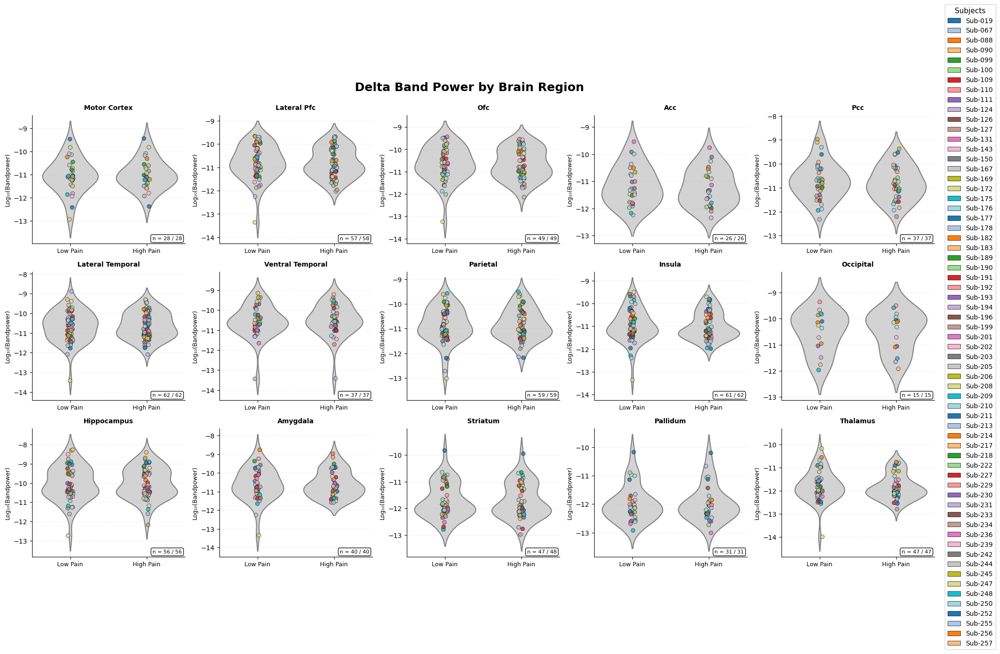


  → theta band...
    ✓ Saved: theta_regional_pain_violin.png


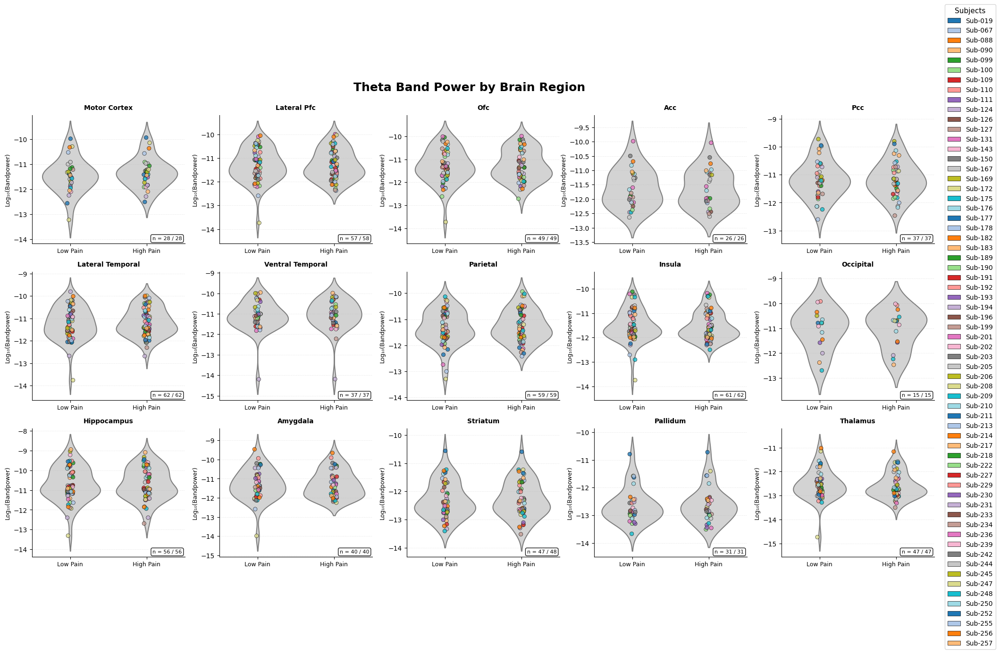


  → alpha band...
    ✓ Saved: alpha_regional_pain_violin.png


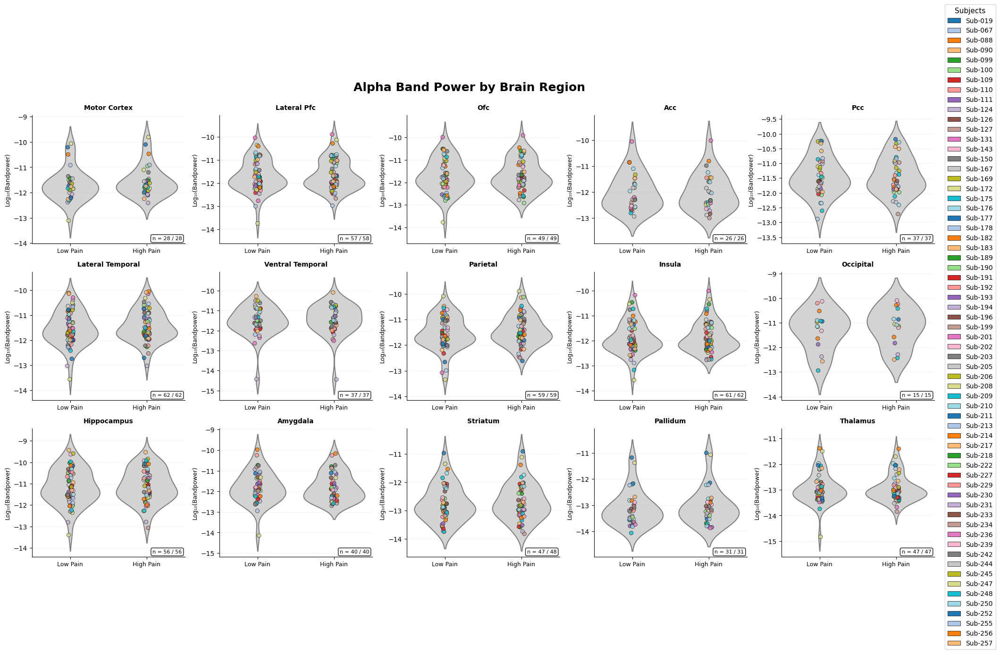


  → beta band...
    ✓ Saved: beta_regional_pain_violin.png


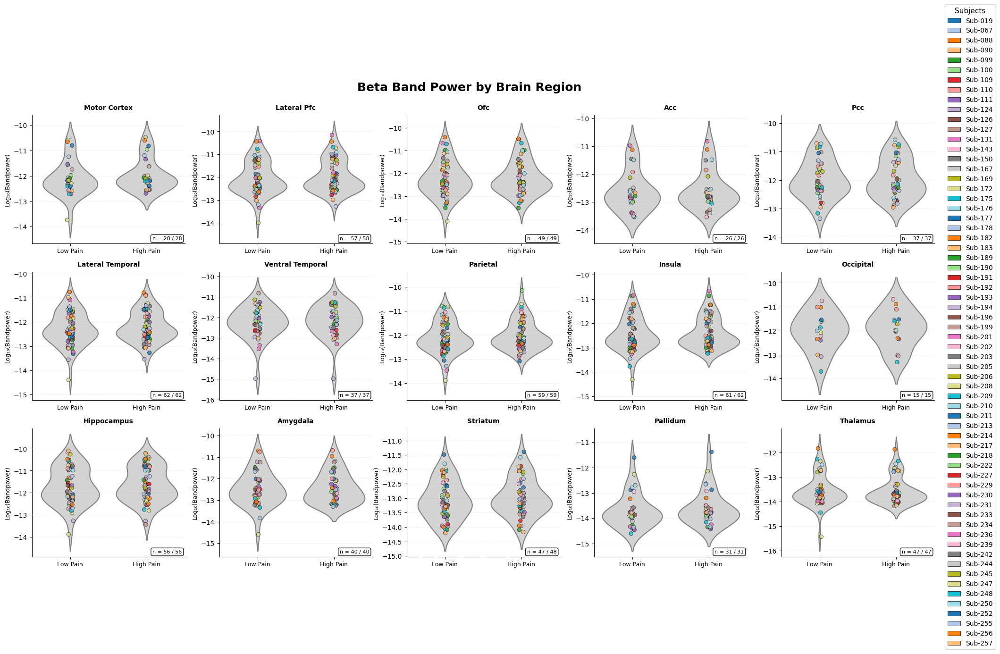


  → gamma band...
    ✓ Saved: gamma_regional_pain_violin.png


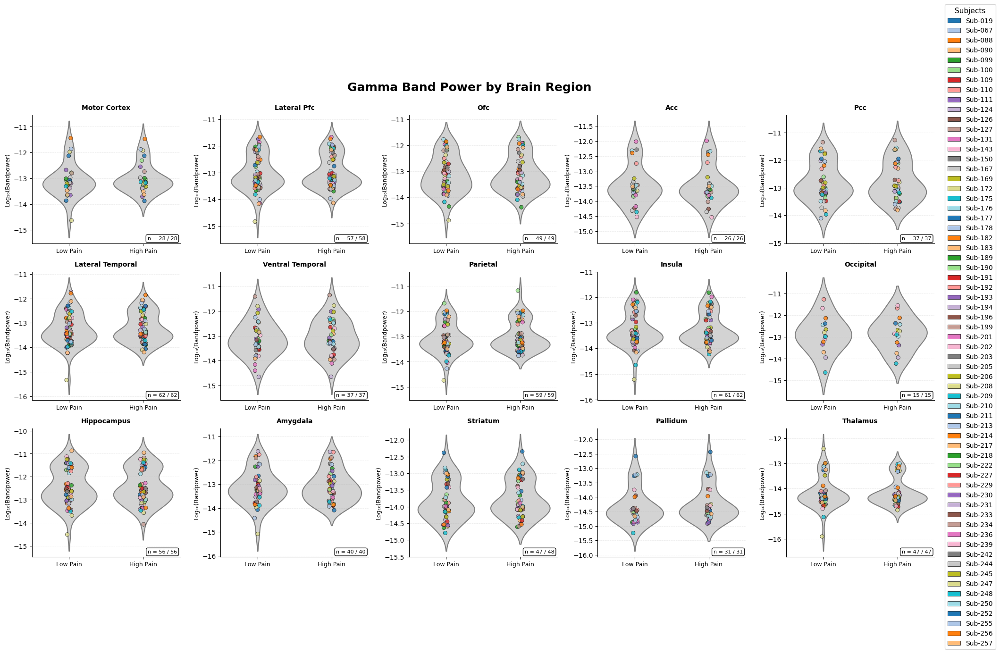


  → high_gamma band...
    ✓ Saved: high_gamma_regional_pain_violin.png


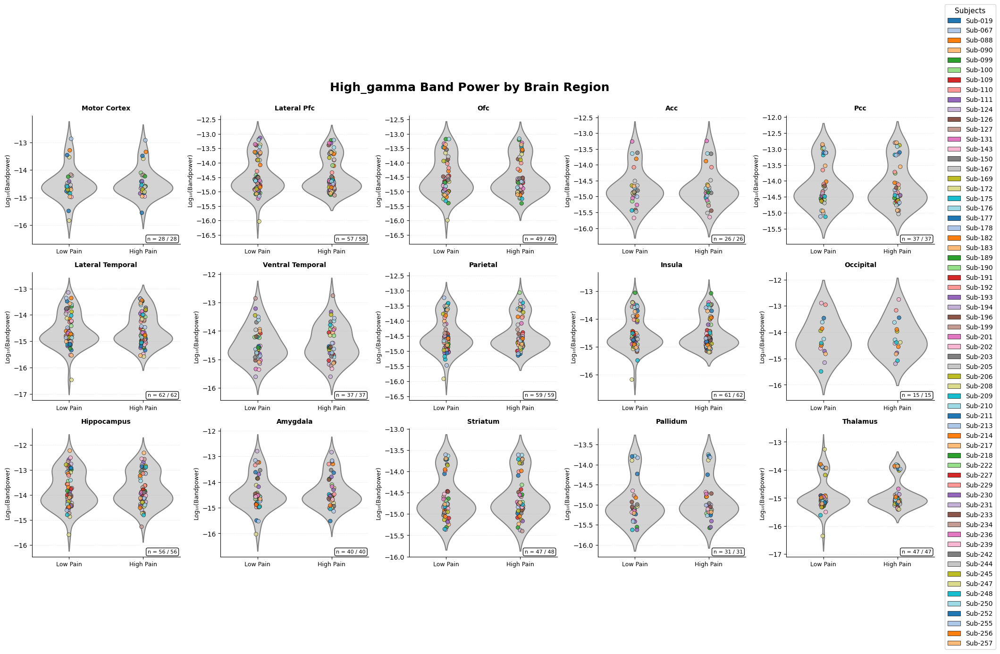


VIOLIN PLOTTING COMPLETE
All figures saved to: plots/pain_score_regional_analysis



In [7]:
"""
===============================================================================
CELL 4: PLOTTING (seaborn version)
===============================================================================
"""

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

def create_violin_plots(plot_data: Dict, save: bool = True, show: bool = True):
    """Create violin plots for each frequency band using seaborn."""

    # Generate unique colors for each subject
    all_subjects = sorted(set([
        subj
        for band_data in plot_data.values()
        for region_data in band_data.values()
        for subj in region_data['subjects_low'] + region_data['subjects_high']
    ]))

    if len(all_subjects) == 0:
        print("No subjects to plot!")
        return

    # Subject color mapping
    palette     = sns.color_palette('tab20', len(all_subjects))
    subject_colors = {subj: palette[i] for i, subj in enumerate(all_subjects)}

    print("Creating violin plots...")
    print(f"Number of subjects: {len(all_subjects)}")

    for band_idx, band_name in enumerate(BAND_NAMES):
        print(f"\n  → {band_name} band...")

        regions = [r for r in REGION_ORDER if r in plot_data[band_idx]]

        if len(regions) == 0:
            print(f"    ✗ No data, skipping")
            continue

        # ── Build long-form DataFrame for seaborn ─────────────────────────
        rows = []
        for region in regions:
            region_data = plot_data[band_idx][region]
            for val, subj in zip(region_data['low_pain'],
                                 region_data['subjects_low']):
                rows.append({'region': region, 'pain_level': 'Low Pain',
                             'power': val, 'subject': subj})
            for val, subj in zip(region_data['high_pain'],
                                 region_data['subjects_high']):
                rows.append({'region': region, 'pain_level': 'High Pain',
                             'power': val, 'subject': subj})

        df = pd.DataFrame(rows)
        df['pain_level'] = pd.Categorical(
            df['pain_level'], categories=['Low Pain', 'High Pain'], ordered=True
        )

        # ── Layout ────────────────────────────────────────────────────────
        n_regions = len(regions)
        n_cols    = min(5, n_regions)
        n_rows    = int(np.ceil(n_regions / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols,
                                 figsize=(4 * n_cols, 3.5 * n_rows))
        fig.suptitle(f'{band_name.capitalize()} Band Power by Brain Region',
                     fontsize=18, fontweight='bold', y=0.995)

        if n_regions == 1:
            axes = [axes]
        elif n_rows == 1:
            axes = list(axes) if isinstance(axes, np.ndarray) else [axes]
        else:
            axes = axes.flatten()

        # ── Plot each region ───────────────────────────────────────────────
        for idx, region in enumerate(regions):
            ax       = axes[idx]
            df_region = df[df['region'] == region]

            if df_region.empty:
                ax.axis('off')
                continue

            # Violin
            sns.violinplot(
                data=df_region,
                x='pain_level', y='power',
                order=['Low Pain', 'High Pain'],
                inner=None,
                color='lightgray',
                linewidth=1.5,
                saturation=0.4,
                ax=ax
            )

            # Individual subject points with jitter
            sns.stripplot(
                data=df_region,
                x='pain_level', y='power',
                order=['Low Pain', 'High Pain'],
                hue='subject',
                palette=subject_colors,
                size=6,
                alpha=0.8,
                jitter=0.04,
                linewidth=0.5,
                edgecolor='black',
                legend=False,
                ax=ax
            )

            # Formatting
            region_title = region.replace('_', ' ').replace('-', ' ').title()
            ax.set_title(region_title, fontsize=10, fontweight='bold', pad=8)
            ax.set_xlabel('')
            ax.set_ylabel('Log₁₀(Bandpower)', fontsize=9)
            ax.tick_params(axis='x', labelsize=9)
            ax.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.5)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            # Sample size annotation
            n_low  = df_region[df_region['pain_level'] == 'Low Pain'].shape[0]
            n_high = df_region[df_region['pain_level'] == 'High Pain'].shape[0]
            ax.text(0.98, 0.02, f'n = {n_low} / {n_high}',
                    transform=ax.transAxes, fontsize=8,
                    va='bottom', ha='right',
                    bbox=dict(boxstyle='round', facecolor='white',
                              alpha=0.9, pad=0.3))

        # Hide unused subplots
        for idx in range(n_regions, len(axes)):
            axes[idx].axis('off')

        # Subject legend
        legend_elements = [
            mpatches.Patch(facecolor=subject_colors[subj],
                           edgecolor='black', linewidth=0.5,
                           label=f'Sub-{subj}')
            for subj in all_subjects
        ]
        fig.legend(handles=legend_elements,
                   loc='center left', bbox_to_anchor=(1.0, 0.5),
                   fontsize=10, title='Subjects', title_fontsize=11,
                   frameon=True)

        plt.tight_layout()

        if save:
            filename = PLOT_DIR / f'{band_name}_regional_pain_violin.png'
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            print(f"    ✓ Saved: {filename.name}")

        if show:
            plt.show()
        else:
            plt.close()

    print(f"\n{'='*80}")
    print(f"VIOLIN PLOTTING COMPLETE")
    print(f"{'='*80}")
    print(f"All figures saved to: {PLOT_DIR}")
    print(f"{'='*80}\n")


create_violin_plots(plot_data, save=True, show=True)

Creating line plots...
Number of subjects: 64

  → delta band...
    ✓ Saved: delta_regional_pain_lines.png


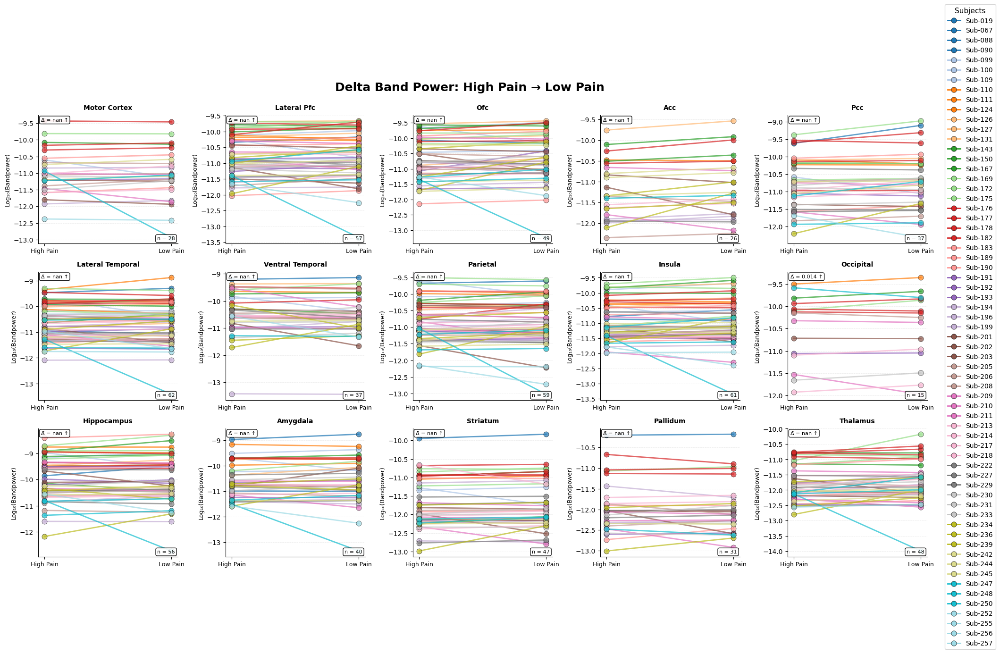


  → theta band...
    ✓ Saved: theta_regional_pain_lines.png


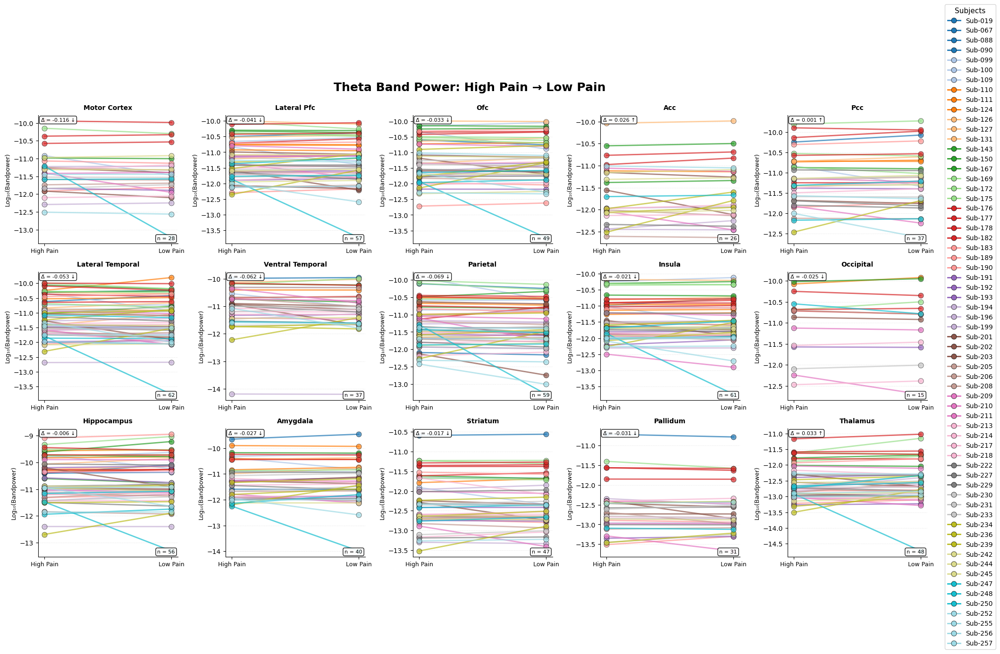


  → alpha band...
    ✓ Saved: alpha_regional_pain_lines.png


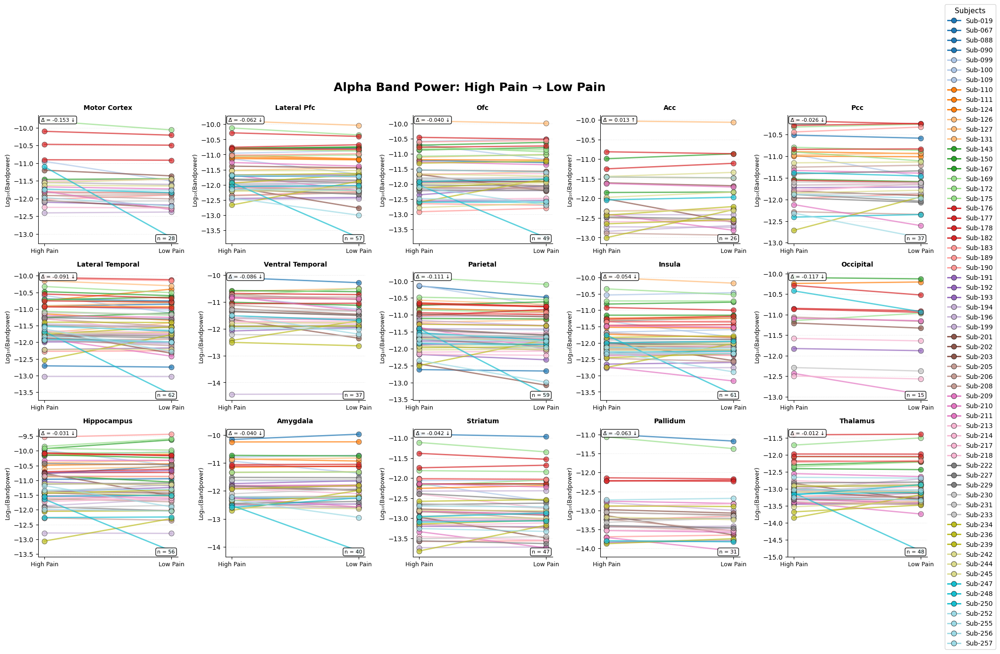


  → beta band...
    ✓ Saved: beta_regional_pain_lines.png


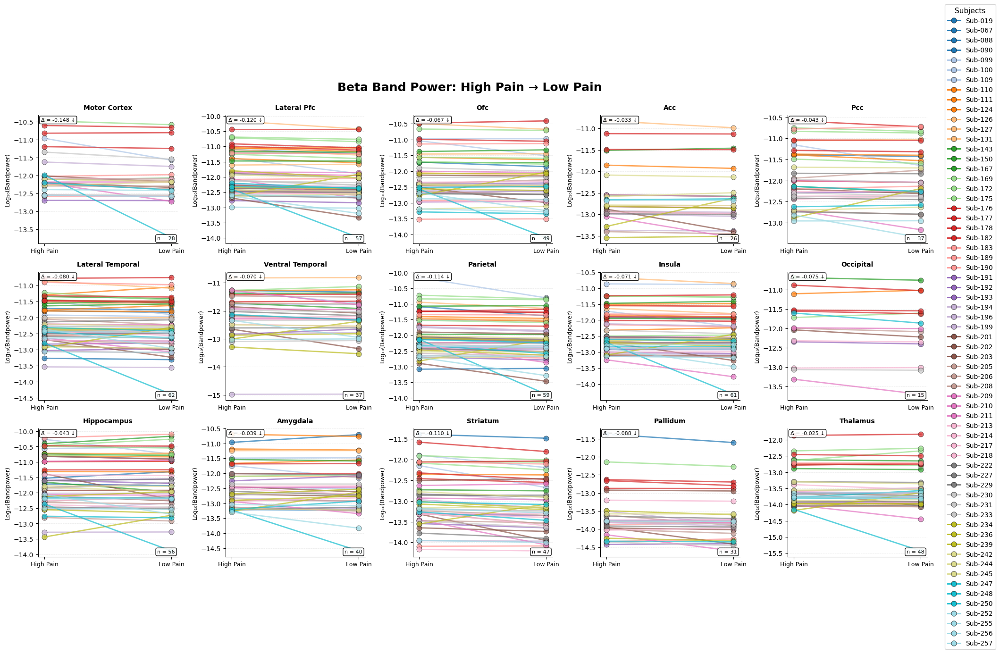


  → gamma band...
    ✓ Saved: gamma_regional_pain_lines.png


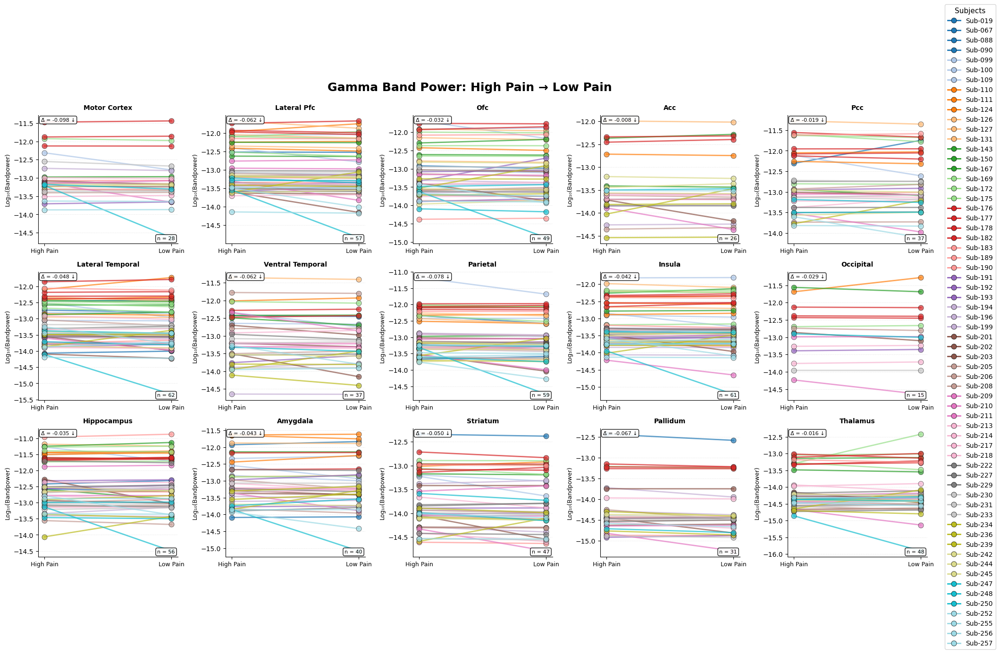


  → high_gamma band...
    ✓ Saved: high_gamma_regional_pain_lines.png


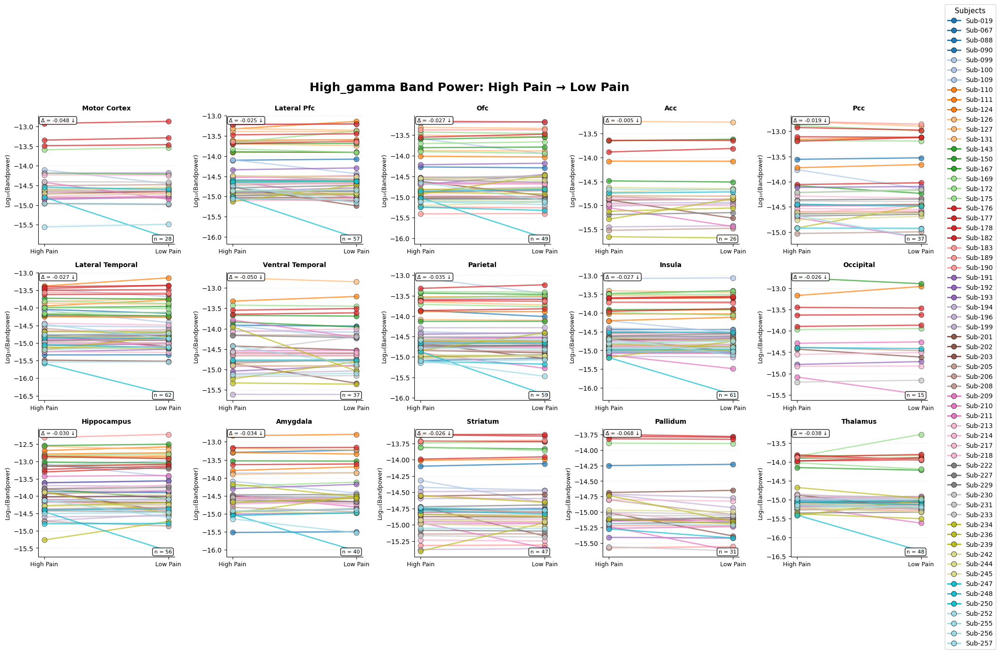


LINE PLOTTING COMPLETE
All figures saved to: plots/pain_score_regional_analysis



In [28]:

"""
===============================================================================
CELL 5 (OPTIONAL): ALTERNATIVE LINE PLOT VISUALIZATION
===============================================================================
This creates line plots connecting high pain to low pain for each subject.
Run this cell if you want to see individual subject trajectories instead of violin plots.
"""

def create_line_plots(plot_data: Dict, save: bool = True, show: bool = True):
    """
    Create line plots showing high-to-low pain change for each subject.
    Each line connects a subject's high pain value to their low pain value.
    """
    
    # Generate unique colors for each subject
    all_subjects = sorted(set([
        subj 
        for band_data in plot_data.values() 
        for region_data in band_data.values()
        for subj in region_data['subjects_low'] + region_data['subjects_high']
    ]))
    
    if len(all_subjects) == 0:
        print("No subjects to plot!")
        return
    
    # Create color mapping
    colors = plt.cm.tab20(np.linspace(0, 1, len(all_subjects)))
    subject_colors = {subj: colors[i] for i, subj in enumerate(all_subjects)}
    
    print("Creating line plots...")
    print(f"Number of subjects: {len(all_subjects)}")
    
    # Create a figure for each band
    for band_idx, band_name in enumerate(BAND_NAMES):
        print(f"\n  → {band_name} band...")
        
        regions = [r for r in REGION_ORDER if r in plot_data[band_idx]]
        
        if len(regions) == 0:
            print(f"    ✗ No data, skipping")
            continue
        
        # Determine subplot layout
        n_regions = len(regions)
        n_cols = min(5, n_regions)
        n_rows = int(np.ceil(n_regions / n_cols))
        
        # Create figure
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3.5*n_rows))
        fig.suptitle(f'{band_name.capitalize()} Band Power: High Pain → Low Pain', 
                     fontsize=18, fontweight='bold', y=0.995)
        
        # Flatten axes for easier iteration
        if n_regions == 1:
            axes = [axes]
        elif n_rows == 1:
            axes = axes if isinstance(axes, np.ndarray) else [axes]
        else:
            axes = axes.flatten()
        
        # Plot each region
        for idx, region in enumerate(regions):
            ax = axes[idx]
            
            region_data = plot_data[band_idx][region]
            
            # Organize data by subject
            subject_data = {}  # {subject_id: {'low': value, 'high': value}}
            
            # Collect low pain values
            for val, subj in zip(region_data['low_pain'], region_data['subjects_low']):
                if subj not in subject_data:
                    subject_data[subj] = {}
                subject_data[subj]['low'] = val
            
            # Collect high pain values
            for val, subj in zip(region_data['high_pain'], region_data['subjects_high']):
                if subj not in subject_data:
                    subject_data[subj] = {}
                subject_data[subj]['high'] = val
            
            # Filter to subjects with both high and low
            complete_subjects = {subj: data for subj, data in subject_data.items() 
                                if 'low' in data and 'high' in data}
            
            if len(complete_subjects) == 0:
                ax.text(0.5, 0.5, 'No paired data', ha='center', va='center', 
                       transform=ax.transAxes, fontsize=12, color='gray')
                ax.set_xticks([])
                ax.set_yticks([])
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(False)
                ax.spines['left'].set_visible(False)
                region_title = region.replace('_', ' ').replace('-', ' ').title()
                ax.set_title(region_title, fontsize=10, fontweight='bold', pad=8)
                continue
            
            # Plot lines connecting high to low for each subject
            for subj, data in complete_subjects.items():
                color = subject_colors[subj]
                
                # Line from high (position 0) to low (position 1)
                ax.plot([0, 1], [data['high'], data['low']], 
                       color=color, alpha=0.7, linewidth=2, marker='o', 
                       markersize=8, markeredgecolor='black', markeredgewidth=0.5)
            
            # Formatting
            ax.set_xticks([0, 1])
            ax.set_xticklabels(['High Pain', 'Low Pain'], fontsize=9)
            ax.set_ylabel('Log₁₀(Bandpower)', fontsize=9)
            
            # Title - clean up region name
            region_title = region.replace('_', ' ').replace('-', ' ').title()
            ax.set_title(region_title, fontsize=10, fontweight='bold', pad=8)
            
            ax.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.5)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
            # Add sample size
            text_str = f"n = {len(complete_subjects)}"
            ax.text(0.98, 0.02, text_str, transform=ax.transAxes,
                   fontsize=8, verticalalignment='bottom', horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, pad=0.3))
            
            # Calculate and display mean change
            changes = [data['low'] - data['high'] for data in complete_subjects.values()]
            mean_change = np.mean(changes)
            change_sign = "↓" if mean_change < 0 else "↑"
            ax.text(0.02, 0.98, f"Δ̄ = {mean_change:.3f} {change_sign}", 
                   transform=ax.transAxes, fontsize=8, 
                   verticalalignment='top', horizontalalignment='left',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, pad=0.3))
        
        # Hide unused subplots
        for idx in range(n_regions, len(axes)):
            axes[idx].axis('off')
        
        # Create legend for subjects
        legend_elements = [plt.Line2D([0], [0], color=subject_colors[subj], 
                                     linewidth=2, marker='o', markersize=8,
                                     label=f'Sub-{subj}',
                                     markeredgecolor='black', markeredgewidth=0.5)
                          for subj in all_subjects]
        
        fig.legend(handles=legend_elements, loc='center left', 
                  bbox_to_anchor=(1.0, 0.5), fontsize=10, 
                  title='Subjects', title_fontsize=11, frameon=True)
        
        plt.tight_layout()
        
        # Save figure
        if save:
            filename = PLOT_DIR / f'{band_name}_regional_pain_lines.png'
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            print(f"    ✓ Saved: {filename.name}")
        
        if show:
            plt.show()
        else:
            plt.close()
    
    print(f"\n{'='*80}")
    print(f"LINE PLOTTING COMPLETE")
    print(f"{'='*80}")
    print(f"All figures saved to: {PLOT_DIR}")
    print(f"{'='*80}\n")


# Create the line plots
create_line_plots(plot_data, save=True, show=True)


In [27]:
"""
===============================================================================
CELL 6: STATISTICAL TESTING
===============================================================================
"""

from scipy import stats
from statsmodels.stats.multitest import multipletests

def run_statistics(plot_data: Dict, 
                   min_paired_subjects: int = 5) -> pd.DataFrame:
    """
    Run Wilcoxon signed-rank tests comparing high vs low pain per region per band.
    Applies FDR correction across all region-band comparisons.

    Args:
        plot_data:             Output of organize_data_for_plotting()
        min_paired_subjects:   Minimum paired subjects required to run test

    Returns:
        DataFrame with one row per region-band combination
    """
    rows = []

    for band_idx, band_name in enumerate(BAND_NAMES):
        for region in REGION_ORDER:
            if region not in plot_data[band_idx]:
                continue

            region_data = plot_data[band_idx][region]

            # Build subject -> value dicts
            low_by_subj  = dict(zip(region_data['subjects_low'],  region_data['low_pain']))
            high_by_subj = dict(zip(region_data['subjects_high'], region_data['high_pain']))

            # Keep only subjects with both values
            paired_subjects = sorted(set(low_by_subj) & set(high_by_subj))
            n_paired = len(paired_subjects)

            if n_paired < min_paired_subjects:
                rows.append({
                    'band':            band_name,
                    'region':          region,
                    'n_paired':        n_paired,
                    'n_low_only':      len(low_by_subj)  - n_paired,
                    'n_high_only':     len(high_by_subj) - n_paired,
                    'mean_low':        np.mean(list(low_by_subj.values()))  if low_by_subj  else np.nan,
                    'mean_high':       np.mean(list(high_by_subj.values())) if high_by_subj else np.nan,
                    'mean_diff':       np.nan,  # high - low
                    'statistic':       np.nan,
                    'p_value':         np.nan,
                    'p_fdr':           np.nan,
                    'significant':     False,
                    'note':            f'insufficient paired n ({n_paired})'
                })
                continue

            low_vals  = np.array([low_by_subj[s]  for s in paired_subjects])
            high_vals = np.array([high_by_subj[s] for s in paired_subjects])

            # Wilcoxon signed-rank test
            # zero_method='wilcox' drops zero differences (standard)
            try:
                stat, p = stats.wilcoxon(high_vals, low_vals, zero_method='wilcox',
                                         alternative='two-sided')
                note = ''
            except ValueError as e:
                # All differences are zero
                stat, p = np.nan, np.nan
                note = str(e)

            rows.append({
                'band':        band_name,
                'region':      region,
                'n_paired':    n_paired,
                'n_low_only':  len(low_by_subj)  - n_paired,
                'n_high_only': len(high_by_subj) - n_paired,
                'mean_low':    np.mean(low_vals),
                'mean_high':   np.mean(high_vals),
                'mean_diff':   np.mean(high_vals - low_vals),  # positive = higher power at high pain
                'statistic':   stat,
                'p_value':     p,
                'p_fdr':       np.nan,   # filled in below
                'significant': False,    # filled in below
                'note':        note
            })

    results_df = pd.DataFrame(rows)

    # FDR correction across all testable comparisons
    testable = results_df['p_value'].notna()
    if testable.sum() > 0:
        _, p_fdr, _, _ = multipletests(results_df.loc[testable, 'p_value'],
                                       method='fdr_bh')
        results_df.loc[testable, 'p_fdr']      = p_fdr
        results_df.loc[testable, 'significant'] = p_fdr < 0.05

    return results_df


def print_statistics_summary(results_df: pd.DataFrame):
    """Print a readable summary of statistical results."""

    print("\n" + "="*80)
    print("STATISTICAL RESULTS (Wilcoxon signed-rank, FDR-corrected)")
    print("="*80)

    sig = results_df[results_df['significant']]
    print(f"\nSignificant results (FDR q<0.05): {len(sig)} / {results_df['p_value'].notna().sum()} tests\n")

    if len(sig) > 0:
        print(sig[['band', 'region', 'n_paired', 'mean_low', 'mean_high',
                   'mean_diff', 'p_value', 'p_fdr']].to_string(index=False, float_format='%.4f'))
    else:
        print("No significant results after FDR correction.")

    print("\n--- Full results by band ---")
    for band_name in BAND_NAMES:
        band_df = results_df[results_df['band'] == band_name].copy()
        testable = band_df['p_value'].notna()
        print(f"\n{band_name.upper()} ({testable.sum()} tests):")
        if testable.sum() == 0:
            print("  No testable comparisons")
            continue
        print(band_df[testable][['region', 'n_paired', 'mean_diff',
                                  'p_value', 'p_fdr', 'significant']]
              .to_string(index=False, float_format='%.4f'))


# Run statistics
stats_results = run_statistics(plot_data, min_paired_subjects=5)

print_statistics_summary(stats_results)

# Save results
stats_out = PLOT_DIR / 'statistical_results.csv'
stats_results.to_csv(stats_out, index=False)
print(f"\n✓ Saved to {stats_out}")


STATISTICAL RESULTS (Wilcoxon signed-rank, FDR-corrected)

Significant results (FDR q<0.05): 17 / 76 tests

 band           region  n_paired  mean_low  mean_high  mean_diff  p_value  p_fdr
alpha     Motor Cortex        28  -11.6921   -11.5392     0.1529   0.0041 0.0210
alpha Lateral Temporal        62  -11.5200   -11.4286     0.0913   0.0003 0.0029
alpha Ventral Temporal        37  -11.5185   -11.4326     0.0859   0.0016 0.0105
alpha         Parietal        59  -11.5409   -11.4298     0.1111   0.0000 0.0007
alpha        Occipital        15  -11.3105   -11.1935     0.1170   0.0067 0.0319
 beta     Motor Cortex        28  -12.1064   -11.9588     0.1477   0.0003 0.0026
 beta      Lateral PFC        57  -12.0618   -11.9415     0.1203   0.0000 0.0000
 beta              OFC        49  -12.2588   -12.1916     0.0672   0.0081 0.0361
 beta Lateral Temporal        62  -12.2802   -12.1998     0.0804   0.0003 0.0026
 beta         Parietal        59  -12.1336   -12.0200     0.1136   0.0000 0.0000


In [25]:
frontal_labels = [
    'superiorfrontal', 'rostralmiddlefrontal', 'caudalmiddlefrontal',
    'parsopercularis', 'parstriangularis', 'parsorbitalis',
    'precentral', 'paracentral', 'frontalpole'
]

print("Coverage of frontal DK labels across subjects:\n")
for dk_label in frontal_labels:
    n_subjects = sum(
        1 for r in all_results 
        if dk_label in r['low_pain'] or 
           f'ctx-lh-{dk_label}' in r['low_pain'] or 
           f'ctx-rh-{dk_label}' in r['low_pain']
    )
    print(f"  {dk_label:30s}: {n_subjects} subjects")

Coverage of frontal DK labels across subjects:

  superiorfrontal               : 44 subjects
  rostralmiddlefrontal          : 32 subjects
  caudalmiddlefrontal           : 17 subjects
  parsopercularis               : 36 subjects
  parstriangularis              : 49 subjects
  parsorbitalis                 : 20 subjects
  precentral                    : 24 subjects
  paracentral                   : 13 subjects
  frontalpole                   : 1 subjects


In [29]:
# Inspect raw paired values for beta Lateral PFC
band_idx = BAND_NAMES.index('beta')
region = 'Lateral PFC'

region_data = plot_data[band_idx][region]
low_by_subj  = dict(zip(region_data['subjects_low'],  region_data['low_pain']))
high_by_subj = dict(zip(region_data['subjects_high'], region_data['high_pain']))
paired_subjects = sorted(set(low_by_subj) & set(high_by_subj))

print(f"{'Subject':>10} {'Low':>10} {'High':>10} {'Diff':>10}")
print("-" * 45)
n_positive = 0
n_negative = 0
for s in paired_subjects:
    low  = low_by_subj[s]
    high = high_by_subj[s]
    diff = high - low
    direction = '↑' if diff > 0 else '↓'
    if diff > 0:
        n_positive += 1
    else:
        n_negative += 1
    print(f"{s:>10} {low:>10.4f} {high:>10.4f} {diff:>10.4f} {direction}")

print(f"\nPositive (high > low): {n_positive}")
print(f"Negative (high < low): {n_negative}")


   Subject        Low       High       Diff
---------------------------------------------
       088   -11.2396   -11.1036     0.1360 ↑
       099   -11.2311   -11.2122     0.0189 ↑
       100   -11.8907   -11.3811     0.5096 ↑
       109   -12.4664   -12.3723     0.0941 ↑
       110   -11.5307   -11.4003     0.1304 ↑
       111   -11.1685   -11.0462     0.1223 ↑
       124   -11.0476   -11.0480    -0.0004 ↓
       126   -11.2796   -11.1025     0.1771 ↑
       127   -11.5822   -11.6096    -0.0274 ↓
       131   -10.4228   -10.1598     0.2630 ↑
       150   -11.1858   -11.1681     0.0177 ↑
       167   -11.4793   -11.4754     0.0039 ↑
       169   -11.3949   -11.2540     0.1410 ↑
       172   -10.8418   -10.7173     0.1245 ↑
       175   -10.7639   -10.6909     0.0730 ↑
       176   -11.0450   -10.9123     0.1326 ↑
       178   -11.1204   -10.9896     0.1308 ↑
       182   -10.4399   -10.4426    -0.0027 ↓
       183   -11.2342   -11.2175     0.0167 ↑
       189   -12.4944   -12.4984    

In [43]:
def run_statistics(plot_data: Dict, 
                   min_paired_subjects: int = 5) -> pd.DataFrame:
    rows = []

    for band_idx, band_name in enumerate(BAND_NAMES):
        for region in REGION_ORDER:
            if region not in plot_data[band_idx]:
                continue

            region_data = plot_data[band_idx][region]
            low_by_subj  = dict(zip(region_data['subjects_low'],  region_data['low_pain']))
            high_by_subj = dict(zip(region_data['subjects_high'], region_data['high_pain']))
            paired_subjects = sorted(set(low_by_subj) & set(high_by_subj))
            n_paired = len(paired_subjects)

            if n_paired < min_paired_subjects:
                rows.append({
                    'band': band_name, 'region': region,
                    'n_paired': n_paired, 'note': f'insufficient paired n ({n_paired})',
                    **{k: np.nan for k in ['mean_low', 'mean_high', 'mean_diff',
                                           'median_diff', 'n_positive', 'n_negative',
                                           'pct_positive', 'statistic', 'p_value',
                                           'p_fdr']},
                    'significant': False,
                })
                continue

            low_vals  = np.array([low_by_subj[s] for s in paired_subjects])
            high_vals = np.array([high_by_subj[s] for s in paired_subjects])
            diffs = high_vals - low_vals

            n_positive = np.sum(diffs > 0)
            n_negative = np.sum(diffs < 0)

            try:
                stat, p = stats.wilcoxon(high_vals, low_vals,
                                         zero_method='wilcox',
                                         alternative='two-sided')
                note = ''
            except ValueError as e:
                stat, p = np.nan, np.nan
                note = str(e)

            rows.append({
                'band':         band_name,
                'region':       region,
                'n_paired':     n_paired,
                'mean_low':     np.mean(low_vals),
                'mean_high':    np.mean(high_vals),
                'mean_diff':    np.mean(diffs),
                'median_diff':  np.median(diffs),   # robust to outliers
                'n_positive':   n_positive,
                'n_negative':   n_negative,
                'pct_positive': 100 * n_positive / n_paired,
                'statistic':    stat,
                'p_value':      p,
                'p_fdr':        np.nan,
                'significant':  False,
                'note':         note,
            })

    results_df = pd.DataFrame(rows)

    testable = results_df['p_value'].notna()
    if testable.sum() > 0:
        _, p_fdr, _, _ = multipletests(results_df.loc[testable, 'p_value'],
                                       method='fdr_bh')
        results_df.loc[testable, 'p_fdr']      = p_fdr
        results_df.loc[testable, 'significant'] = p_fdr < 0.05

    return results_df


def print_statistics_summary(results_df: pd.DataFrame):
    print("\n" + "="*80)
    print("STATISTICAL RESULTS (Wilcoxon signed-rank, FDR-corrected)")
    print("="*80)

    sig = results_df[results_df['significant']]
    print(f"\nSignificant results (FDR q<0.05): {len(sig)} / "
          f"{results_df['p_value'].notna().sum()} tests\n")

    if len(sig) > 0:
        print(sig[['band', 'region', 'n_paired', 'mean_diff', 'median_diff',
                   'n_positive', 'n_negative', 'pct_positive',
                   'p_value', 'p_fdr']].to_string(index=False, float_format='%.4f'))

    print("\n--- Full results by band ---")
    for band_name in BAND_NAMES:
        band_df = results_df[results_df['band'] == band_name].copy()
        testable = band_df['p_value'].notna()
        print(f"\n{band_name.upper()} ({testable.sum()} tests):")
        if testable.sum() == 0:
            print("  No testable comparisons")
            continue
        print(band_df[testable][['region', 'n_paired', 'mean_diff', 'median_diff',
                                  'n_positive', 'pct_positive',
                                  'p_value', 'p_fdr', 'significant']]
              .to_string(index=False, float_format='%.4f'))


# Run statistics
stats_results = run_statistics(plot_data, min_paired_subjects=5)

print_statistics_summary(stats_results)

# Save results
stats_out = PLOT_DIR / 'statistical_results.csv'
stats_results.to_csv(stats_out, index=False)
print(f"\n✓ Saved to {stats_out}")


STATISTICAL RESULTS (Wilcoxon signed-rank, FDR-corrected)

Significant results (FDR q<0.05): 17 / 76 tests

 band           region  n_paired  mean_diff  median_diff  n_positive  n_negative  pct_positive  p_value  p_fdr
alpha     Motor Cortex        28     0.1529       0.0419          21           7       75.0000   0.0041 0.0210
alpha Lateral Temporal        62     0.0913       0.0533          47          15       75.8065   0.0003 0.0029
alpha Ventral Temporal        37     0.0859       0.0428          27          10       72.9730   0.0016 0.0105
alpha         Parietal        59     0.1111       0.0580          42          17       71.1864   0.0000 0.0007
alpha        Occipital        15     0.1170       0.0718          13           2       86.6667   0.0067 0.0319
 beta     Motor Cortex        28     0.1477       0.0407          22           6       78.5714   0.0003 0.0026
 beta      Lateral PFC        57     0.1203       0.0730          47          10       82.4561   0.0000 0.0000
 be

In [30]:
# Check pain score distribution for outlier subjects
for subject_id in ['247', '234', '201', '209', '255']:
    result = next((r for r in all_results if r['subject_id'] == subject_id), None)
    if result is None:
        continue
    
    pain_df = load_pain_scores(subject_id, '01')
    q25 = pain_df['max_pain'].quantile(0.25)
    q75 = pain_df['max_pain'].quantile(0.75)
    
    print(f"\nSub-{subject_id}:")
    print(f"  Pain range: {pain_df['max_pain'].min():.1f} - {pain_df['max_pain'].max():.1f}")
    print(f"  Q25: {q25:.1f}, Q75: {q75:.1f}")
    print(f"  N low pain epochs: {(pain_df['max_pain'] <= q25).sum()}")
    print(f"  N high pain epochs: {(pain_df['max_pain'] >= q75).sum()}")


Sub-247:
  Pain range: 0.0 - 7.0
  Q25: 0.0, Q75: 2.0
  N low pain epochs: 24
  N high pain epochs: 32

Sub-234:
  Pain range: 0.0 - 10.0
  Q25: 5.0, Q75: 8.0
  N low pain epochs: 17
  N high pain epochs: 25

Sub-201:
  Pain range: 0.0 - 7.0
  Q25: 0.0, Q75: 4.0
  N low pain epochs: 14
  N high pain epochs: 12

Sub-209:
  Pain range: 0.0 - 8.0
  Q25: 2.0, Q75: 5.0
  N low pain epochs: 13
  N high pain epochs: 14

Sub-255:
  Pain range: 0.0 - 8.0
  Q25: 2.0, Q75: 4.0
  N low pain epochs: 21
  N high pain epochs: 15


In [42]:
"""
===============================================================================
CELL 6: STATISTICAL TESTING (with outlier removal)
===============================================================================
"""

from scipy import stats
from statsmodels.stats.multitest import multipletests

OUTLIER_SD_THRESHOLD = 3  # Remove subjects whose diff exceeds this many SDs


def run_statistics(plot_data: Dict,
                   min_paired_subjects: int = 5,
                   outlier_sd: float = OUTLIER_SD_THRESHOLD) -> pd.DataFrame:
    """
    Run Wilcoxon signed-rank tests comparing high vs low pain per region per band.
    Removes outlier subjects whose paired difference exceeds outlier_sd standard
    deviations from the mean difference before testing.
    Applies FDR correction across all region-band comparisons.

    Args:
        plot_data:             Output of organize_data_for_plotting()
        min_paired_subjects:   Minimum paired subjects required to run test
                               (evaluated AFTER outlier removal)
        outlier_sd:            SD threshold for outlier removal (default: 3)

    Returns:
        DataFrame with one row per region-band combination
    """
    rows = []

    for band_idx, band_name in enumerate(BAND_NAMES):
        for region in REGION_ORDER:
            if region not in plot_data[band_idx]:
                continue

            region_data = plot_data[band_idx][region]
            low_by_subj  = dict(zip(region_data['subjects_low'],  region_data['low_pain']))
            high_by_subj = dict(zip(region_data['subjects_high'], region_data['high_pain']))
            paired_subjects = sorted(set(low_by_subj) & set(high_by_subj))
            n_paired_raw = len(paired_subjects)

            if n_paired_raw < min_paired_subjects:
                rows.append({
                    'band':           band_name,
                    'region':         region,
                    'n_paired_raw':   n_paired_raw,
                    'n_outliers':     0,
                    'n_paired':       n_paired_raw,
                    'note':           f'insufficient paired n ({n_paired_raw})',
                    **{k: np.nan for k in [
                        'mean_low', 'mean_high', 'mean_diff', 'median_diff',
                        'n_positive', 'n_negative', 'pct_positive',
                        'statistic', 'p_value', 'p_fdr'
                    ]},
                    'significant': False,
                })
                continue

            low_vals  = np.array([low_by_subj[s]  for s in paired_subjects])
            high_vals = np.array([high_by_subj[s] for s in paired_subjects])
            diffs     = high_vals - low_vals

            # ── Outlier removal ───────────────────────────────────────────
            diff_mean = np.mean(diffs)
            diff_std  = np.std(diffs)

            if diff_std > 0:
                outlier_mask = np.abs(diffs - diff_mean) > (outlier_sd * diff_std)
            else:
                outlier_mask = np.zeros(len(diffs), dtype=bool)

            n_outliers   = int(np.sum(outlier_mask))
            keep_mask    = ~outlier_mask

            low_clean    = low_vals[keep_mask]
            high_clean   = high_vals[keep_mask]
            diffs_clean  = diffs[keep_mask]
            n_paired     = int(np.sum(keep_mask))
            # ─────────────────────────────────────────────────────────────

            if n_paired < min_paired_subjects:
                rows.append({
                    'band':           band_name,
                    'region':         region,
                    'n_paired_raw':   n_paired_raw,
                    'n_outliers':     n_outliers,
                    'n_paired':       n_paired,
                    'note':           f'insufficient n after outlier removal ({n_paired})',
                    **{k: np.nan for k in [
                        'mean_low', 'mean_high', 'mean_diff', 'median_diff',
                        'n_positive', 'n_negative', 'pct_positive',
                        'statistic', 'p_value', 'p_fdr'
                    ]},
                    'significant': False,
                })
                continue

            n_positive = int(np.sum(diffs_clean > 0))
            n_negative = int(np.sum(diffs_clean < 0))

            try:
                stat, p = stats.wilcoxon(high_clean, low_clean,
                                         zero_method='wilcox',
                                         alternative='two-sided')
                note = ''
            except ValueError as e:
                stat, p = np.nan, np.nan
                note = str(e)

            rows.append({
                'band':           band_name,
                'region':         region,
                'n_paired_raw':   n_paired_raw,
                'n_outliers':     n_outliers,
                'n_paired':       n_paired,
                'mean_low':       np.mean(low_clean),
                'mean_high':      np.mean(high_clean),
                'mean_diff':      np.mean(diffs_clean),
                'median_diff':    np.median(diffs_clean),
                'n_positive':     n_positive,
                'n_negative':     n_negative,
                'pct_positive':   100 * n_positive / n_paired,
                'statistic':      stat,
                'p_value':        p,
                'p_fdr':          np.nan,
                'significant':    False,
                'note':           note,
            })

    results_df = pd.DataFrame(rows)

    # FDR correction across all testable comparisons
    testable = results_df['p_value'].notna()
    if testable.sum() > 0:
        _, p_fdr, _, _ = multipletests(results_df.loc[testable, 'p_value'],
                                       method='fdr_bh')
        results_df.loc[testable, 'p_fdr']      = p_fdr
        results_df.loc[testable, 'significant'] = p_fdr < 0.05

    return results_df


def print_statistics_summary(results_df: pd.DataFrame):
    """Print a readable summary of statistical results."""

    print("\n" + "="*80)
    print(f"STATISTICAL RESULTS (Wilcoxon signed-rank, FDR-corrected, "
          f"outliers removed at {OUTLIER_SD_THRESHOLD} SD)")
    print("="*80)

    sig = results_df[results_df['significant']]
    n_testable = results_df['p_value'].notna().sum()
    print(f"\nSignificant results (FDR q<0.05): {len(sig)} / {n_testable} tests\n")

    if len(sig) > 0:
        print(sig[['band', 'region', 'n_paired_raw', 'n_outliers', 'n_paired',
                   'mean_diff', 'median_diff', 'n_positive', 'n_negative',
                   'pct_positive', 'p_value', 'p_fdr'
                   ]].to_string(index=False, float_format='%.4f'))
    else:
        print("No significant results after FDR correction.")

    # Report how many outliers were removed overall
    total_outliers = results_df['n_outliers'].sum()
    total_raw      = results_df['n_paired_raw'].sum()
    print(f"\nTotal outliers removed: {total_outliers:.0f} / {total_raw:.0f} "
          f"subject-region-band observations "
          f"({100*total_outliers/total_raw:.1f}%)")

    print("\n--- Full results by band ---")
    for band_name in BAND_NAMES:
        band_df  = results_df[results_df['band'] == band_name].copy()
        testable = band_df['p_value'].notna()
        print(f"\n{band_name.upper()} ({testable.sum()} tests):")
        if testable.sum() == 0:
            print("  No testable comparisons")
            continue
        print(band_df[testable][[
            'region', 'n_paired_raw', 'n_outliers', 'n_paired',
            'mean_diff', 'median_diff', 'n_positive', 'pct_positive',
            'p_value', 'p_fdr', 'significant'
        ]].to_string(index=False, float_format='%.4f'))


# Run statistics
stats_results = run_statistics(plot_data, min_paired_subjects=5,
                               outlier_sd=OUTLIER_SD_THRESHOLD)

print_statistics_summary(stats_results)

# Save results
stats_out = PLOT_DIR / 'statistical_results.csv'
stats_results.to_csv(stats_out, index=False)
print(f"\n✓ Saved to {stats_out}")


STATISTICAL RESULTS (Wilcoxon signed-rank, FDR-corrected, outliers removed at 3 SD)

Significant results (FDR q<0.05): 18 / 76 tests

 band           region  n_paired_raw  n_outliers  n_paired  mean_diff  median_diff  n_positive  n_negative  pct_positive  p_value  p_fdr
alpha     Motor Cortex            28           1        27     0.0844       0.0349          20           7       74.0741   0.0076 0.0340
alpha Lateral Temporal            62           1        61     0.0620       0.0515          46          15       75.4098   0.0006 0.0044
alpha Ventral Temporal            37           1        36     0.1087       0.0437          27           9       75.0000   0.0003 0.0034
alpha         Parietal            59           1        58     0.0795       0.0578          41          17       70.6897   0.0001 0.0012
alpha        Occipital            15           0        15     0.1170       0.0718          13           2       86.6667   0.0067 0.0340
 beta     Motor Cortex            28       

In [34]:
def run_broadband_statistics(plot_data: Dict,
                             outlier_sd: float = OUTLIER_SD_THRESHOLD) -> pd.DataFrame:
    """
    Test for overall power increases per frequency band collapsed across all regions.
    Each subject contributes one value per band = mean across all regions they have data in.
    """
    rows = []

    for band_idx, band_name in enumerate(BAND_NAMES):

        # Collect per-subject values averaged across all regions
        subject_low  = defaultdict(list)
        subject_high = defaultdict(list)

        for region in REGION_ORDER:
            if region not in plot_data[band_idx]:
                continue

            region_data  = plot_data[band_idx][region]
            low_by_subj  = dict(zip(region_data['subjects_low'],  region_data['low_pain']))
            high_by_subj = dict(zip(region_data['subjects_high'], region_data['high_pain']))

            for subj, val in low_by_subj.items():
                subject_low[subj].append(val)
            for subj, val in high_by_subj.items():
                subject_high[subj].append(val)

        # Average across regions for each subject
        low_by_subj_avg  = {s: np.mean(v) for s, v in subject_low.items()}
        high_by_subj_avg = {s: np.mean(v) for s, v in subject_high.items()}

        # Keep only paired subjects
        paired_subjects = sorted(set(low_by_subj_avg) & set(high_by_subj_avg))
        n_paired_raw    = len(paired_subjects)

        low_vals  = np.array([low_by_subj_avg[s]  for s in paired_subjects])
        high_vals = np.array([high_by_subj_avg[s] for s in paired_subjects])
        diffs     = high_vals - low_vals

        # Outlier removal
        diff_mean = np.mean(diffs)
        diff_std  = np.std(diffs)
        if diff_std > 0:
            outlier_mask = np.abs(diffs - diff_mean) > (outlier_sd * diff_std)
        else:
            outlier_mask = np.zeros(len(diffs), dtype=bool)

        n_outliers  = int(np.sum(outlier_mask))
        keep_mask   = ~outlier_mask
        low_clean   = low_vals[keep_mask]
        high_clean  = high_vals[keep_mask]
        diffs_clean = diffs[keep_mask]
        n_paired    = int(np.sum(keep_mask))

        n_positive = int(np.sum(diffs_clean > 0))
        n_negative = int(np.sum(diffs_clean < 0))

        try:
            stat, p = stats.wilcoxon(high_clean, low_clean,
                                     zero_method='wilcox',
                                     alternative='two-sided')
            note = ''
        except ValueError as e:
            stat, p = np.nan, np.nan
            note = str(e)

        rows.append({
            'band':          band_name,
            'n_paired_raw':  n_paired_raw,
            'n_outliers':    n_outliers,
            'n_paired':      n_paired,
            'mean_low':      np.mean(low_clean),
            'mean_high':     np.mean(high_clean),
            'mean_diff':     np.mean(diffs_clean),
            'median_diff':   np.median(diffs_clean),
            'n_positive':    n_positive,
            'n_negative':    n_negative,
            'pct_positive':  100 * n_positive / n_paired,
            'statistic':     stat,
            'p_value':       p,
            'note':          note,
        })

    results_df = pd.DataFrame(rows)

    # FDR correction across the 6 band-level tests
    testable = results_df['p_value'].notna()
    if testable.sum() > 0:
        _, p_fdr, _, _ = multipletests(results_df.loc[testable, 'p_value'],
                                       method='fdr_bh')
        results_df.loc[testable, 'p_fdr']      = p_fdr
        results_df.loc[testable, 'significant'] = p_fdr < 0.05
    else:
        results_df['p_fdr']      = np.nan
        results_df['significant'] = False

    return results_df


def print_broadband_summary(results_df: pd.DataFrame):
    print("\n" + "="*80)
    print(f"BROADBAND RESULTS — collapsed across all regions "
          f"(outliers removed at {OUTLIER_SD_THRESHOLD} SD)")
    print("="*80)
    print(results_df[[
        'band', 'n_paired_raw', 'n_outliers', 'n_paired',
        'mean_diff', 'median_diff', 'n_positive', 'pct_positive',
        'p_value', 'p_fdr', 'significant'
    ]].to_string(index=False, float_format='%.4f'))


# Run broadband statistics
broadband_results = run_broadband_statistics(plot_data,
                                             outlier_sd=OUTLIER_SD_THRESHOLD)
print_broadband_summary(broadband_results)

# Save
broadband_out = PLOT_DIR / 'broadband_statistical_results.csv'
broadband_results.to_csv(broadband_out, index=False)
print(f"\n✓ Saved to {broadband_out}")


BROADBAND RESULTS — collapsed across all regions (outliers removed at 3 SD)
      band  n_paired_raw  n_outliers  n_paired  mean_diff  median_diff  n_positive  pct_positive  p_value  p_fdr significant
     delta            63           0        63        NaN          NaN          19       30.1587      NaN    NaN         NaN
     theta            63           1        62    -0.0019      -0.0167          27       43.5484   0.2431 0.3038       False
     alpha            63           1        62     0.0323       0.0150          37       59.6774   0.1046 0.2614       False
      beta            63           1        62     0.0523       0.0314          45       72.5806   0.0000 0.0001        True
     gamma            63           1        62     0.0241       0.0069          37       59.6774   0.2108 0.3038       False
high_gamma            63           1        62     0.0151      -0.0011          31       50.0000   0.9302 0.9302       False

✓ Saved to plots/pain_score_regional_analysis/b